# Proiect: A New Adaptive Switching Median Filter (ASWM)

## Displaying Input Images



C:\Users\swarn\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


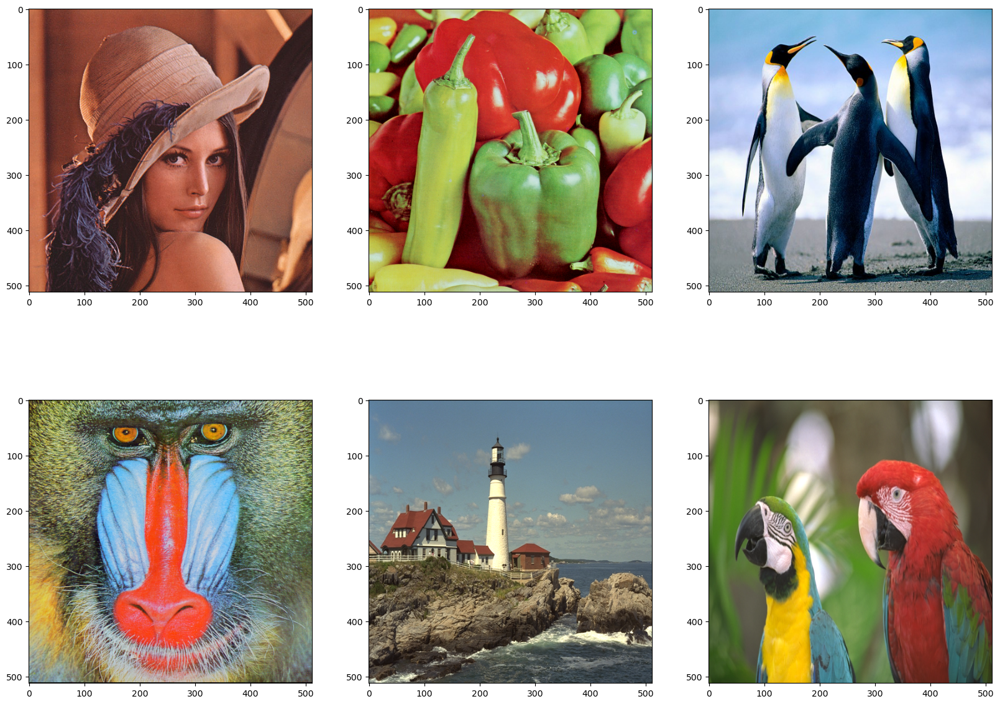

In [3]:
from skimage import io, color, measure
import matplotlib.pyplot as plt
import numpy as np

#giving the directory path to images
dir_path = './images/'
img_names = ['lena_color_512.bmp', 'peppers_512.png', 'penguins_512.jpg',
             'baboon_512.png', 'lighthouse_512.bmp', 'parrots_512.bmp']

img_paths = [dir_path + _ for _ in img_names]

fig = plt.figure(figsize=(20, 15))

#iterating over each image and printing
for i, img_path in enumerate(img_paths):
    img = io.imread(img_path)
    fig.add_subplot(2,3,i+1); plt.imshow(img)

## Defining the impulsive noise function (salt and pepper) and applying it to images

In [7]:
def sp_noise(img_orig, ratio = 0.1):
    img = img_orig.copy()
    #determine rows column and no of channel for image
    l, c, ch = img.shape
    #no of pixels to be modified
    length = int(l * c * ratio)
    #generating row and column indices where noise is to be added
    lin = np.random.randint(0, l, [length])
    col = np.random.randint(0, c, [length])
    up_down = np.random.randint(0, 2, [length])
    
    #for a row and a column and a channel we modify the intensity value to 0 or 255 
    for i in range(length):
        img[lin[i], col[i], np.random.randint(0, 3)] = 255 * up_down[i]
    return img

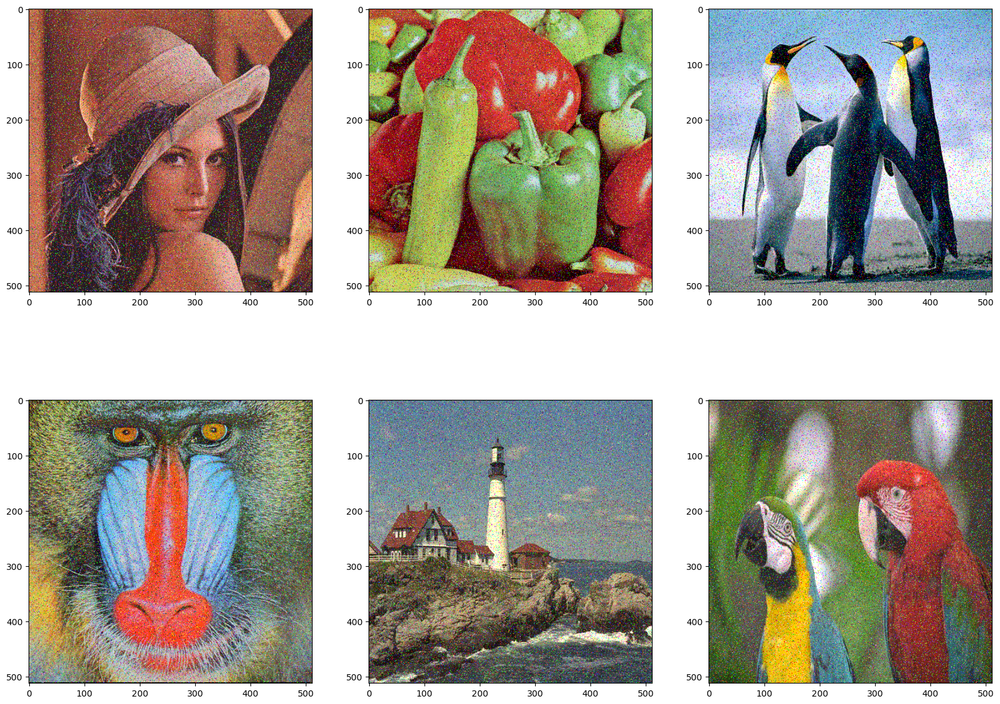

In [8]:
prob = 0.3

fig = plt.figure(figsize=(20, 15))

#adding noise to input images
for i, img_path in enumerate(img_paths):
    img = io.imread(img_path)
    img_noise = sp_noise(img, prob)
    fig.add_subplot(2,3,i+1); plt.imshow(img_noise)

## Implementation of  ASWM (Adaptive Switching Median Filter)

In [15]:


def ASWM_filter(img, delta = 0.1, error = 0.01):
    img_out = img.copy()
    l, c, ch = img_out.shape
    
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):
                alpha = 20
                #taking out window of 3*3
                window = img[i-1:i+2, j-1:j+2, k]
                
                # Initialization of weights to 1
                weights = np.array([[[1] * 3] * 3])
                
                #calculating mean of the window 
                windowMean = np.sum(np.multiply(weights, window)) / np.sum(weights)
                    
                while True:
                    windowMeanOld = windowMean
                    
                    # Step 1: Estimate the weights
                    weights = 1 / (np.abs((window - windowMean)) + delta)
                    windowMean = np.sum(np.multiply(weights, window)) / np.sum(weights)
                    
                    # Step 2 condtion
                    if np.abs(windowMean - windowMeanOld) < error:
                        break
                    alpha *= 0.8
                    
                    
                #calculating standard deviation of window
                windowStdDeviation = np.sqrt(np.sum(np.multiply(weights, (window - windowMean)**2)) / np.sum(weights))
                
                if np.abs(img_out[i, j, k] - windowMean) > (alpha * windowStdDeviation):
                    img_out[i, j, k] = np.sort(window, axis = None)[4]
                else:
                    img_out[i, j, k] = img_out[i, j, k]
                
    return img_out.astype(np.uint8)

# Classical Median Filter

In [10]:
def median_filter(img):
    img_out = img.copy()
    
    l, c, ch = img_out.shape
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):
                V = np.sort(img[i-1:i+2, j-1:j+2, k], axis = None)
                img_out[i, j, k] = V[4]
                
    return img_out.astype(np.uint8)

# Switching Median Filter 

In [11]:
def swm_filter(img):
    img_out = img.copy()
    
    l, c, ch = img_out.shape
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):    
                V = np.sort(img[i-1:i+2, j-1:j+2, k], axis = None)
                V_min, V_max = V[0], V[-1]
                
                if V_min < img_out[i, j, k] < V_max:
                    pass # no filtering needed
                else:
                    median = V[4]
                    if median != V_min and median != V_max:
                        img_out[i, j, k] = median
                    else:
                        img_out[i, j, k] = img_out[i-1, j, k]
                
    return img_out.astype(np.uint8)

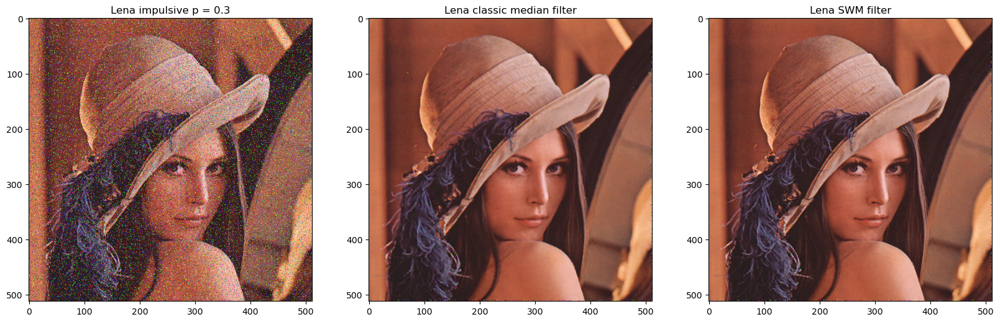

In [12]:
from skimage import io, color, measure

path = './images/'
img_path = path+'lena_color_512.bmp'

prob = 0.3

img = io.imread(img_path)
img_noise = sp_noise(img, prob)

img_median = median_filter(img_noise)
img_swm = swm_filter(img_noise)

fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1,3,1).set_title(f'Lena impulsive p = {prob}'); plt.imshow(img_noise)
fig.add_subplot(1,3,2).set_title('Lena classic median filter'); plt.imshow(img_median)
fig.add_subplot(1,3,3).set_title('Lena SWM filter'); plt.imshow(img_swm)

### Applying the ASWM filter to an image

Duration: 0:04:08.081213


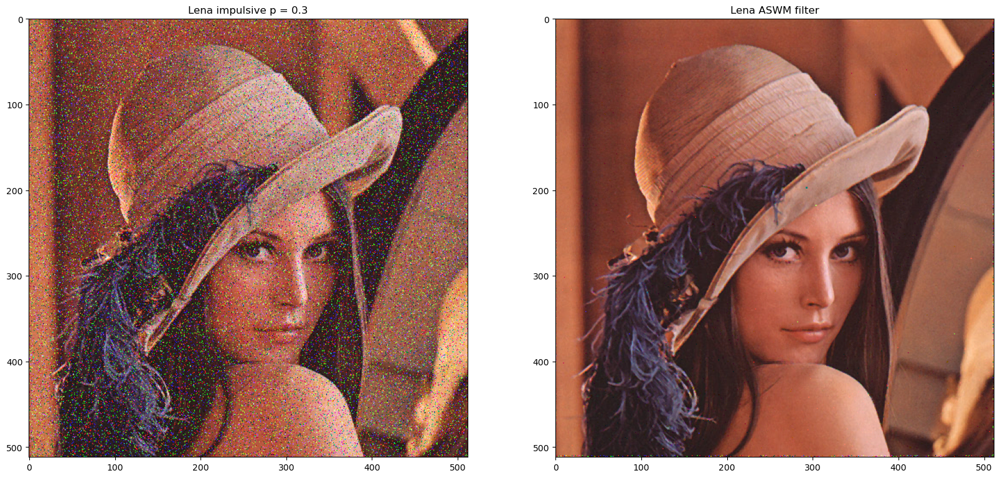

In [7]:
from datetime import datetime
tic = datetime.now()

path = './images/'
img_path = path+'lena_color_512.bmp'

prob = 0.3

img = io.imread(img_path)
img_noise = sp_noise(img, prob)

img_ASWM = ASWM_filter(img_noise)

fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1,2,1).set_title(f'Lena impulsive p = {prob}'); plt.imshow(img_noise)
fig.add_subplot(1,2,2).set_title('Lena ASWM filter'); plt.imshow(img_ASWM)

print(f'Duration: {datetime.now() - tic}')